In [1]:
%matplotlib notebook
%matplotlib inline

In [2]:
import numpy as np
import matplotlib as mpl
from matplotlib import pyplot as plt
import matplotlib.dates as mdates
from scipy import signal 
import soundfile as sf
from scipy.fft import rfft, rfftfreq
import librosa
import librosa.display
from sklearn.cluster import KMeans
import time
import stumpy
import pandas as pd
import seaborn as sns
from scipy.signal import correlate

In [3]:
#Load dataset

data = np.load("birdsong_dataset_mono.npz", allow_pickle=True)
sample_rates = list(data["sample_rates"])
signals = list(data["signals"])

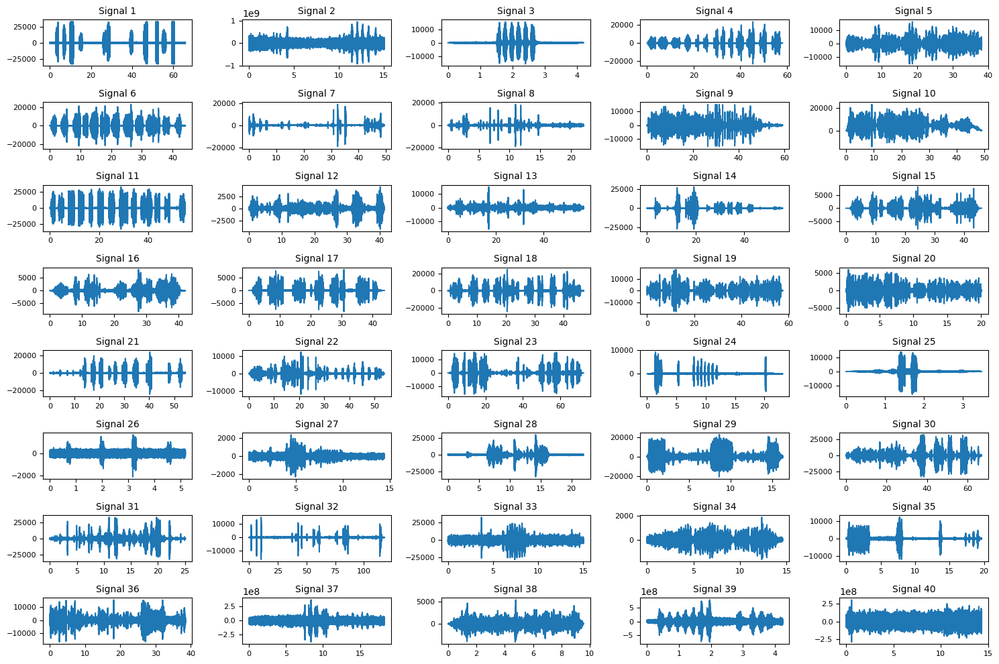

In [4]:
# Visualize all signals

samp_r = sample_rates
sig = signals

num_signals = len(sig)
rows = 8
cols = 5

fig, axes = plt.subplots(rows, cols, figsize=(15, 10))
axes = axes.flatten()

for i, signal in enumerate(sig):
    # Ensure we don’t go beyond the available axes
    if i >= len(axes):
        break

    t = np.arange(len(signal)) / samp_r[i]  # time axis in seconds
    axes[i].plot(t, signal)
    axes[i].set_title(f"Signal {i+1}", fontsize=10)
    axes[i].tick_params(labelsize=8)

# Hide unused subplots
for j in range(i+1, rows*cols):
    axes[j].axis('off')

plt.tight_layout()
plt.show()


In [6]:
# Downsampling to target rate
from scipy import signal #Needs to be here too for some reason for it to work

target_rate = 32000

resampled_signals = []

for i, (sig, sr) in enumerate(zip(signals, sample_rates)):
    print(f"Resampling signal {i+1}/{len(signals)} — original {sr} Hz")

    sig = sig.astype(np.float32)

    if sr == target_rate:
        resampled = sig
    else:
        num_target_samples = int(len(sig) * target_rate / sr)
        resampled = signal.resample(sig, num_target_samples)

    # Normalize amplitude to [-1, 1]
    resampled /= np.max(np.abs(resampled) + 1e-12)
    resampled_signals.append(resampled.astype(np.float32))

print(f"All signals resampled to {target_rate} Hz")


Resampling signal 1/40 — original 48000 Hz
Resampling signal 2/40 — original 32000 Hz
Resampling signal 3/40 — original 44100 Hz
Resampling signal 4/40 — original 44100 Hz
Resampling signal 5/40 — original 44100 Hz
Resampling signal 6/40 — original 44100 Hz
Resampling signal 7/40 — original 44100 Hz
Resampling signal 8/40 — original 48000 Hz
Resampling signal 9/40 — original 48000 Hz
Resampling signal 10/40 — original 48000 Hz
Resampling signal 11/40 — original 48000 Hz
Resampling signal 12/40 — original 44100 Hz
Resampling signal 13/40 — original 48000 Hz
Resampling signal 14/40 — original 44100 Hz
Resampling signal 15/40 — original 44100 Hz
Resampling signal 16/40 — original 48000 Hz
Resampling signal 17/40 — original 48000 Hz
Resampling signal 18/40 — original 48000 Hz
Resampling signal 19/40 — original 44100 Hz
Resampling signal 20/40 — original 44100 Hz
Resampling signal 21/40 — original 44100 Hz
Resampling signal 22/40 — original 48000 Hz
Resampling signal 23/40 — original 48000 

In [7]:
#Dynamic filtering function

def band_pass_filter(x,fc,Fs):
    wc=tuple(f/(Fs/2) for f in fc)
    b, a = signal.butter(4, wc, 'bandpass')
    y = signal.filtfilt(b, a, x)
    return y

def dynamic_band_pass_filter(x, Fs, threshold_ratio=0.5, margin_hz=50, exclude_below=3500, exclude_above=6000):
    """
    Automatically choose fc based on FFT peak frequencies.
    threshold_ratio: ratio (0–1) of max magnitude to define strong frequency band.
    margin_hz: frequency margin to widen the band edges.
    """
    N = len(x)
    freqs = rfftfreq(N, 1/Fs)
    fft_mag = np.abs(rfft(x))

    valid_idx = (freqs >= exclude_below) & (freqs <= exclude_above)
    freqs = freqs[valid_idx]
    fft_mag = fft_mag[valid_idx]

    threshold = threshold_ratio * np.max(fft_mag)
    strong_freqs = freqs[fft_mag > threshold]
    
    if len(strong_freqs) == 0:
        print("No strong frequencies detected. Returning original signal.")
        return x, (0, Fs/2)

    f_low = max(0, np.min(strong_freqs) - margin_hz)
    f_high = min(Fs/2, np.max(strong_freqs) + margin_hz)
    fc = (f_low, f_high)
    
    y = band_pass_filter(x, fc, Fs)
    
    return y, fc

/tmp/ipykernel_8948/995407926.py:32: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/home/cloviss/Documents/ARIA/Signal/ARIA_Signal/env/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


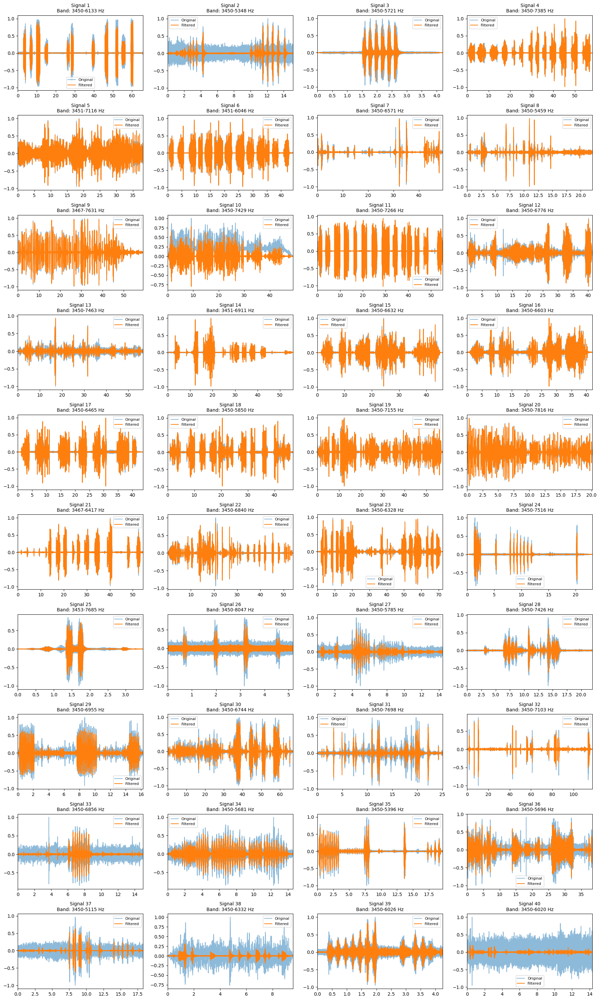

In [8]:
#Denoising, takes 1m50s to run, but it works

Fs = 32000
denoised_signals = []

# Create one figure with multiple subplots
num_signals = len(resampled_signals)
cols = 4
rows = int(np.ceil(num_signals / cols))
fig, axes = plt.subplots(rows, cols, figsize=(18, rows * 3))
axes = axes.flatten()

for i, x in enumerate(resampled_signals):
    N = len(x)
    t = np.arange(N) / Fs

    # Apply dynamic band-pass filter
    y, fc = dynamic_band_pass_filter(x, Fs, threshold_ratio=0.2, exclude_above=8000)
    denoised_signals.append(y)

    # Plot original and filtered signal
    axes[i].plot(t, x, alpha=0.5, label='Original')
    axes[i].plot(t, y, label='Filtered')
    axes[i].set_xlim(0, (N-1)/Fs)
    axes[i].set_title(f"Signal {i+1}\nBand: {fc[0]:.0f}-{fc[1]:.0f} Hz", fontsize=10)
    axes[i].legend(fontsize=8)

# Hide unused subplots
for j in range(i+1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()


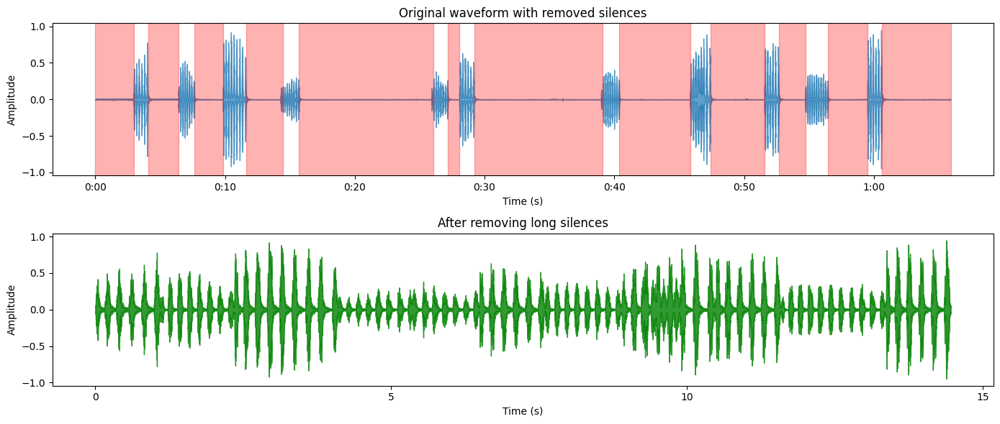

Removed silences > 0.5s
Original length: 65.93s → Trimmed length: 14.46s


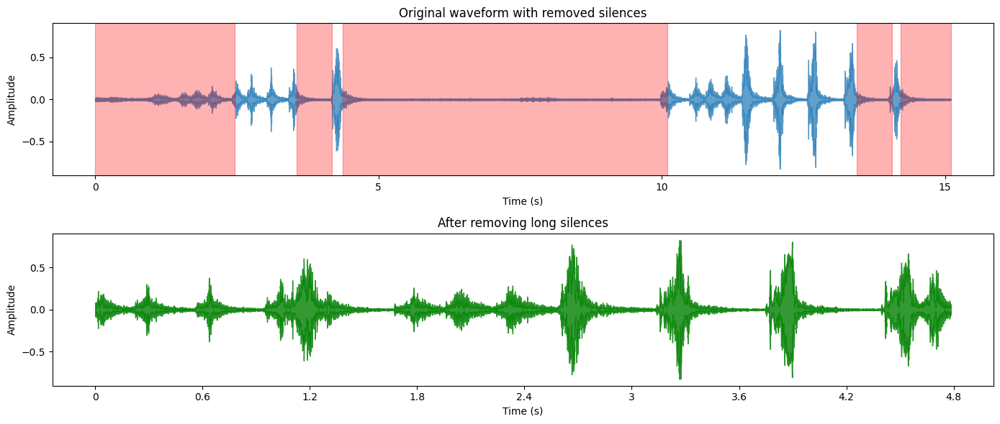

Removed silences > 0.5s
Original length: 15.10s → Trimmed length: 4.78s


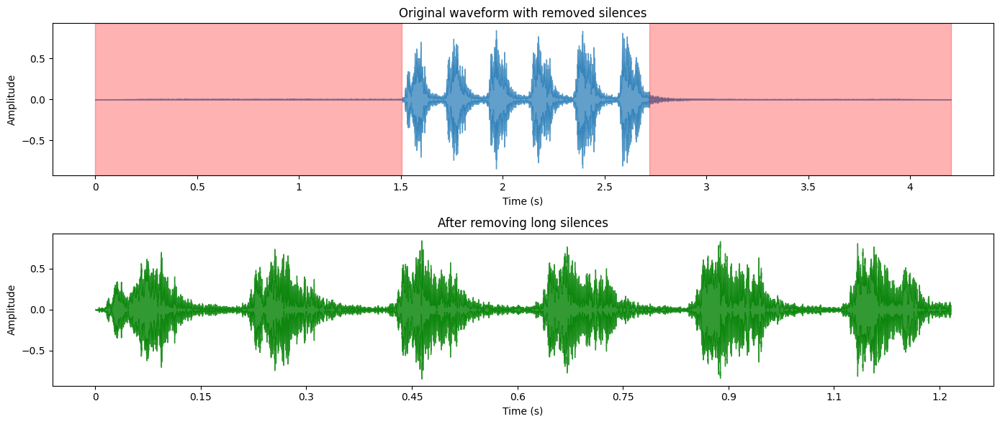

Removed silences > 0.5s
Original length: 4.20s → Trimmed length: 1.22s


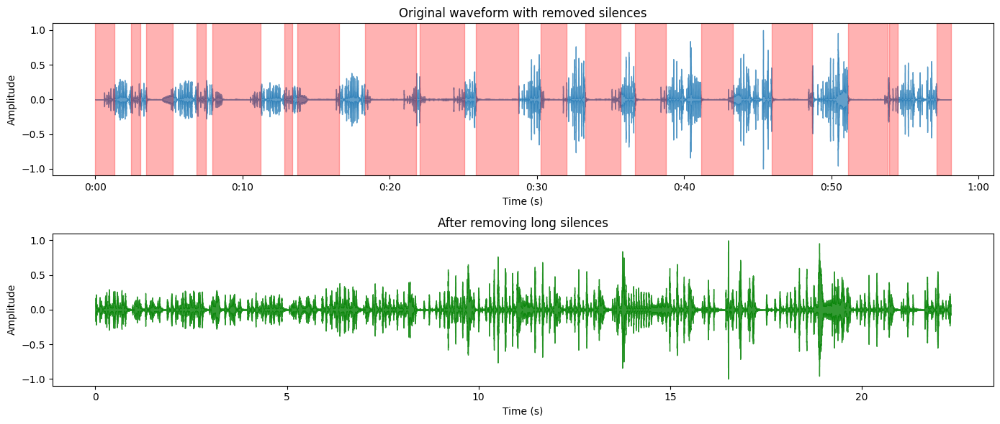

Removed silences > 0.5s
Original length: 58.12s → Trimmed length: 22.32s


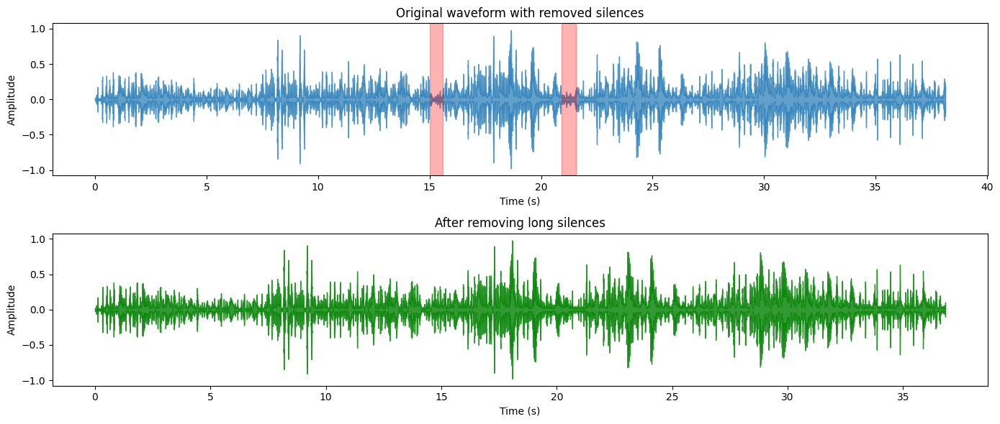

Removed silences > 0.5s
Original length: 38.13s → Trimmed length: 36.83s


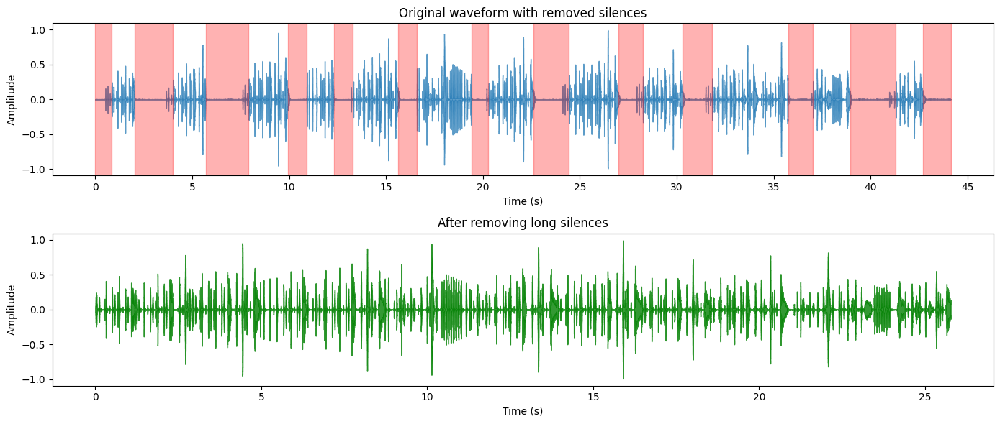

Removed silences > 0.5s
Original length: 44.14s → Trimmed length: 25.78s


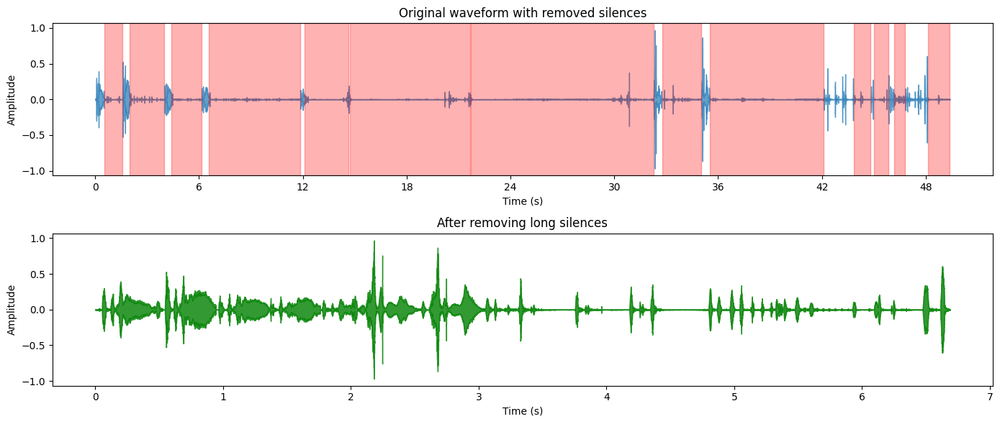

Removed silences > 0.5s
Original length: 49.40s → Trimmed length: 6.69s


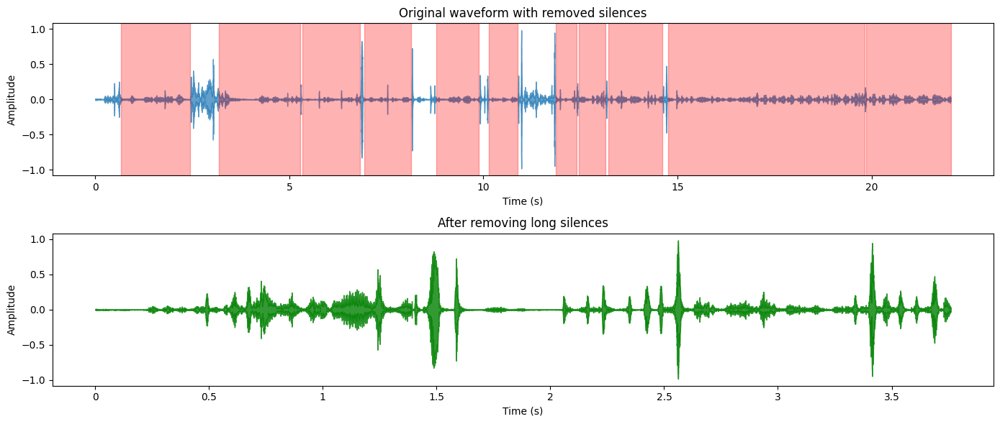

Removed silences > 0.5s
Original length: 22.04s → Trimmed length: 3.76s


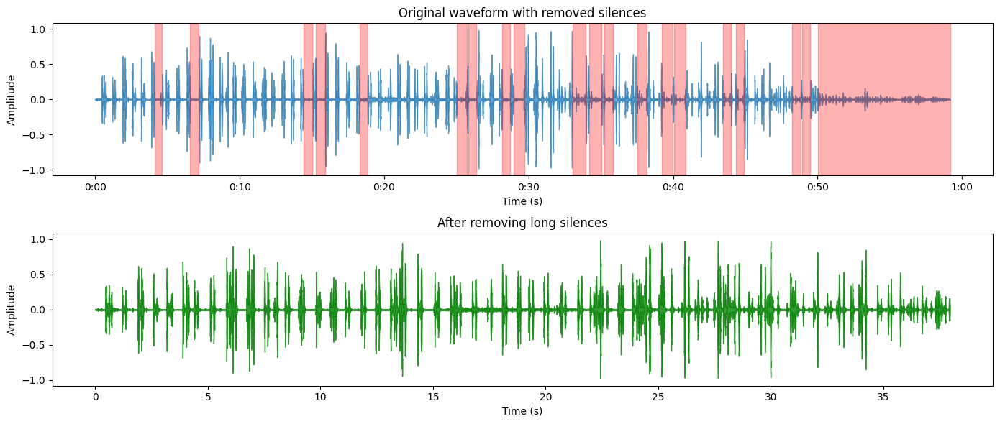

Removed silences > 0.5s
Original length: 59.17s → Trimmed length: 37.97s


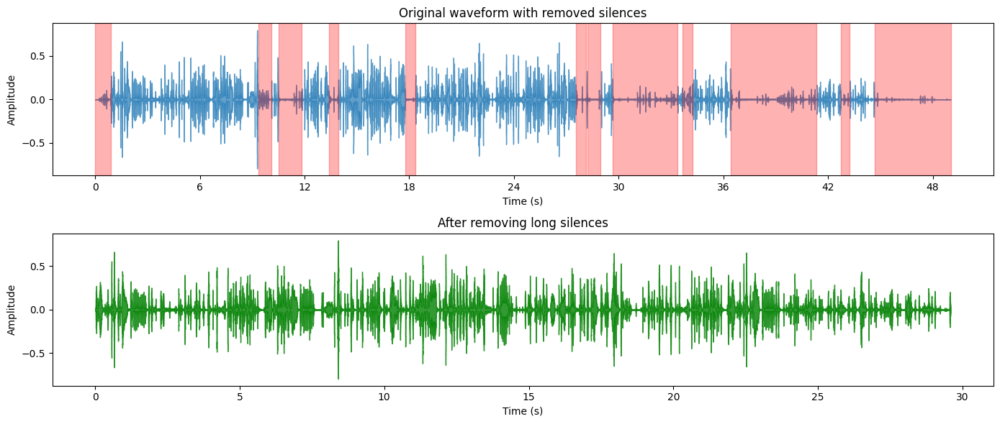

Removed silences > 0.5s
Original length: 49.03s → Trimmed length: 29.60s


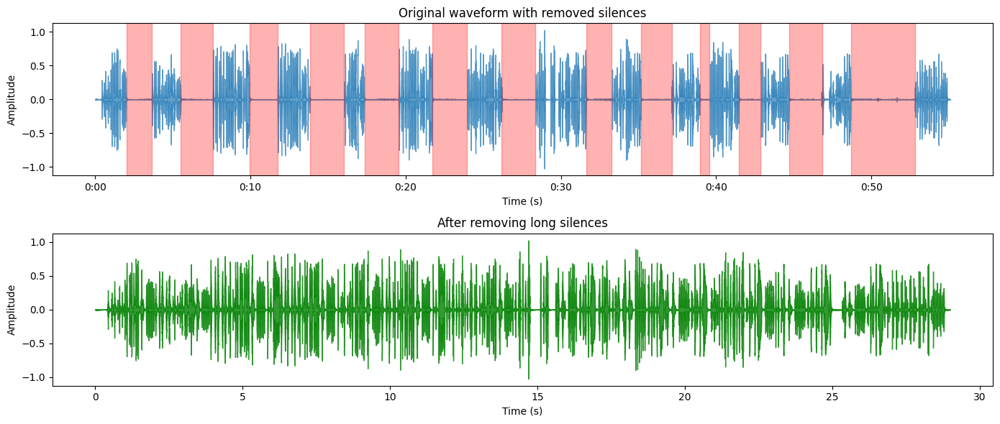

Removed silences > 0.5s
Original length: 55.08s → Trimmed length: 29.00s


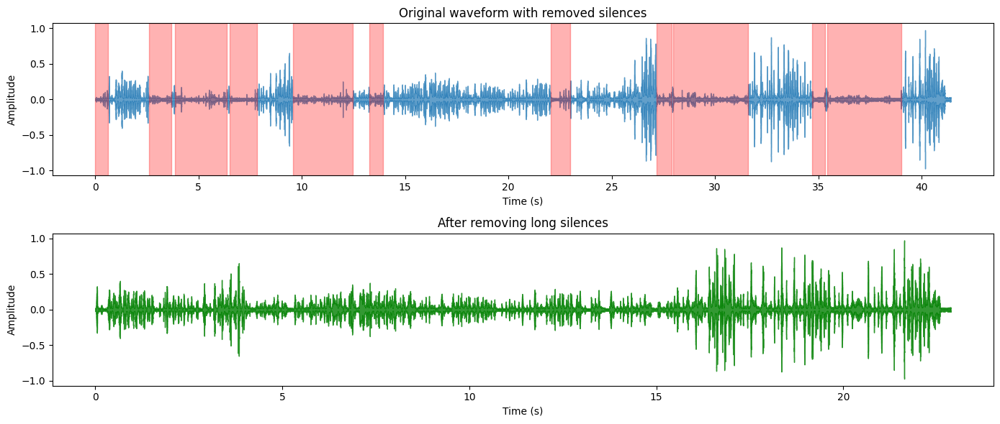

Removed silences > 0.5s
Original length: 41.42s → Trimmed length: 22.87s


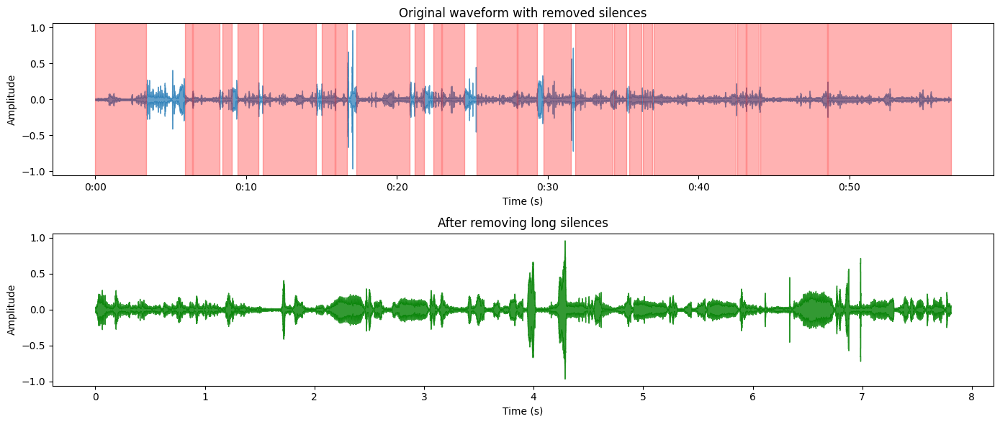

Removed silences > 0.5s
Original length: 56.71s → Trimmed length: 7.81s


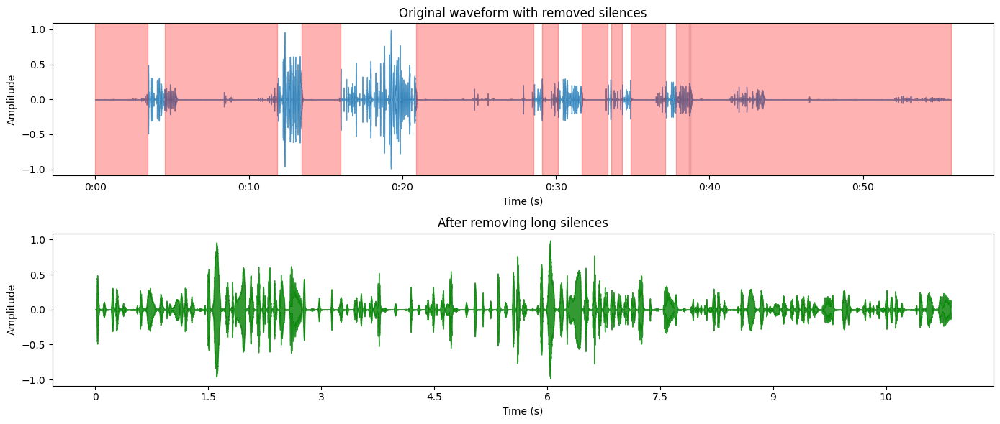

Removed silences > 0.5s
Original length: 55.72s → Trimmed length: 11.36s


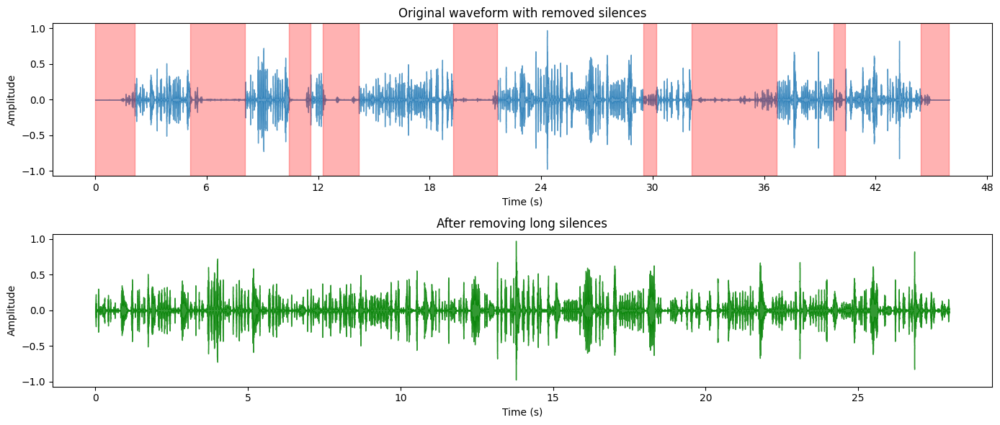

Removed silences > 0.5s
Original length: 45.96s → Trimmed length: 27.98s


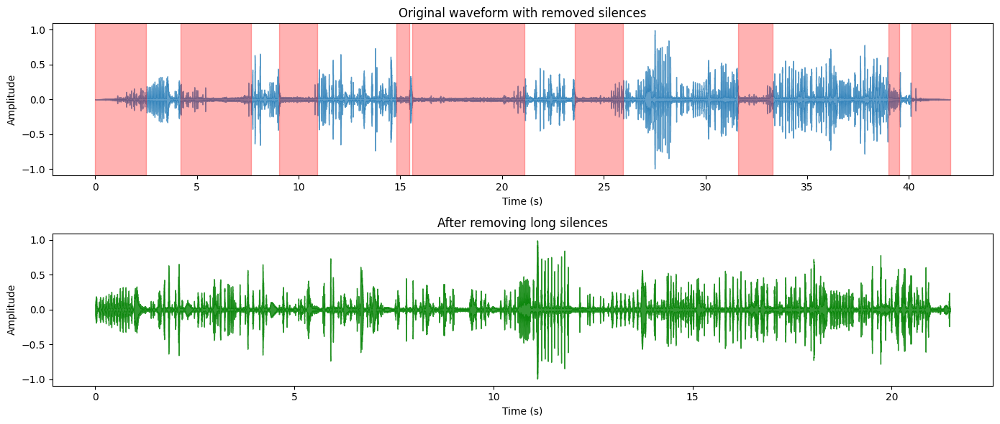

Removed silences > 0.5s
Original length: 42.02s → Trimmed length: 21.47s


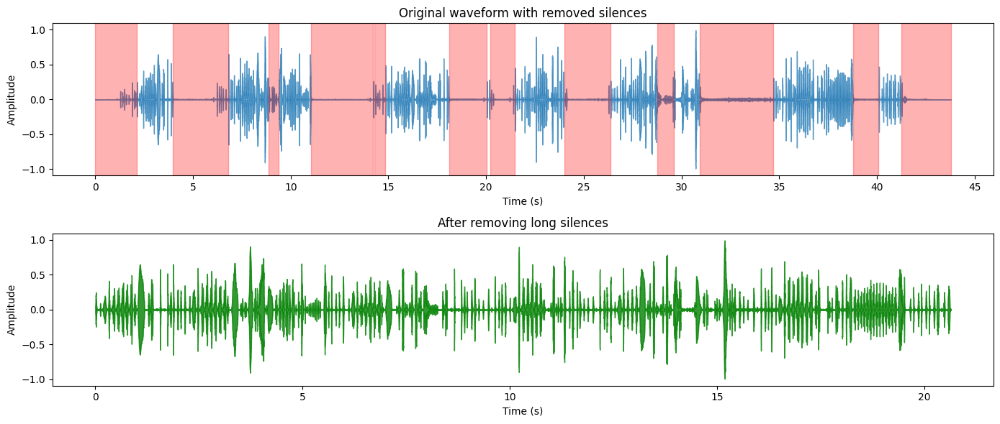

Removed silences > 0.5s
Original length: 43.78s → Trimmed length: 20.64s


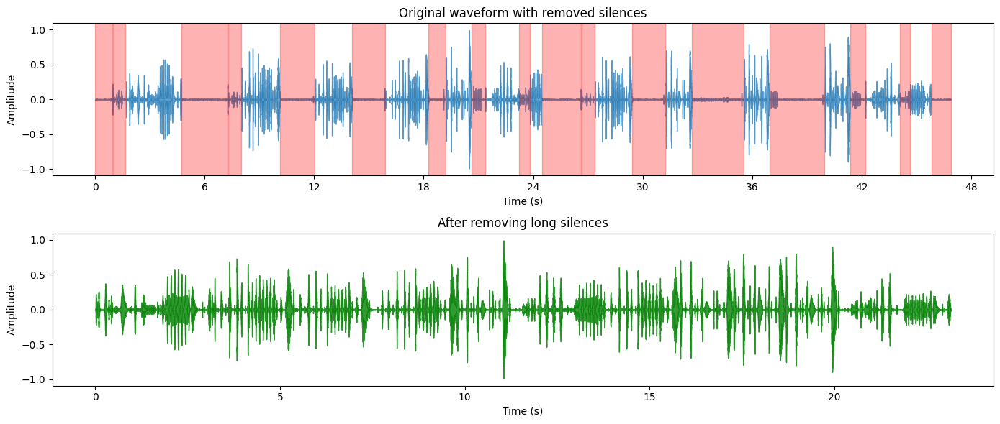

Removed silences > 0.5s
Original length: 46.89s → Trimmed length: 23.15s


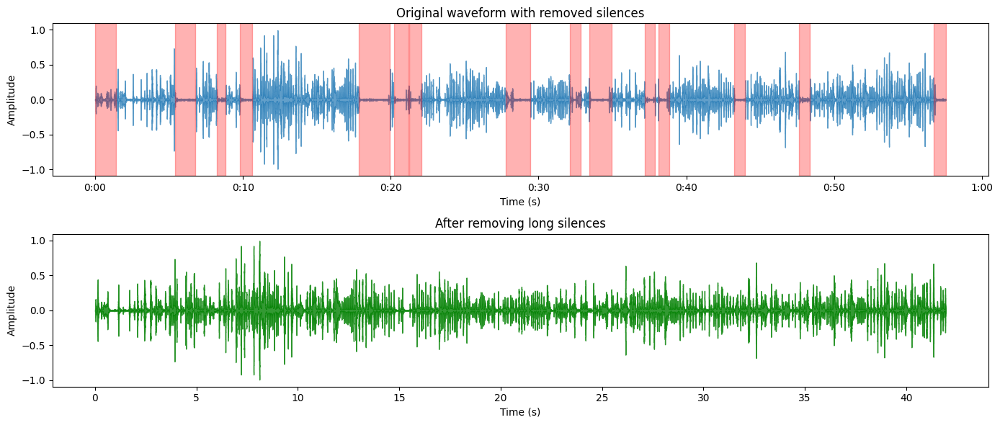

Removed silences > 0.5s
Original length: 57.55s → Trimmed length: 41.97s


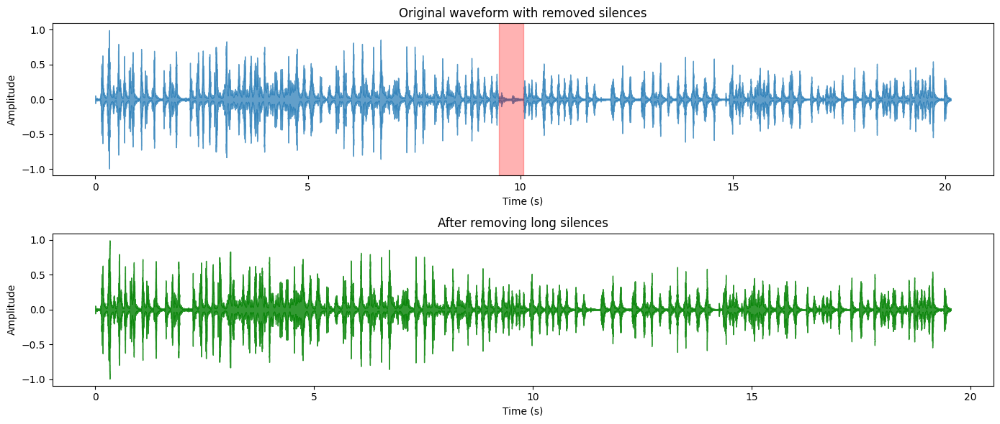

Removed silences > 0.5s
Original length: 20.13s → Trimmed length: 19.55s


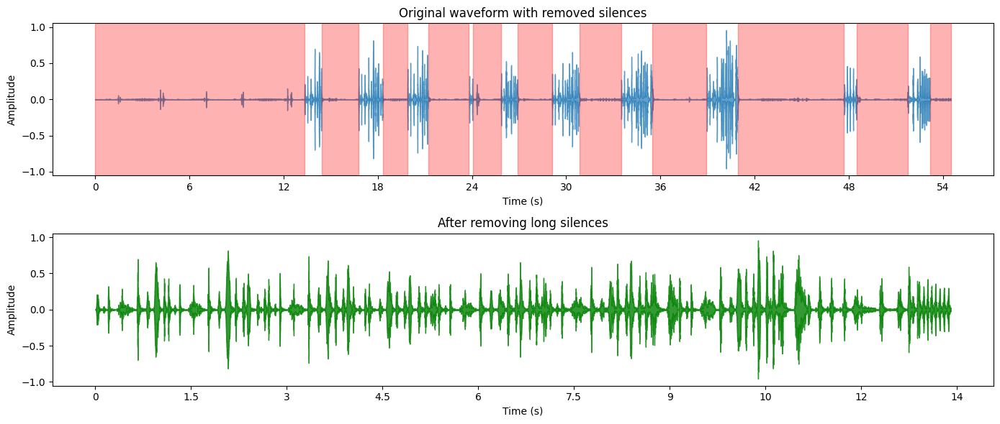

Removed silences > 0.5s
Original length: 54.50s → Trimmed length: 13.41s


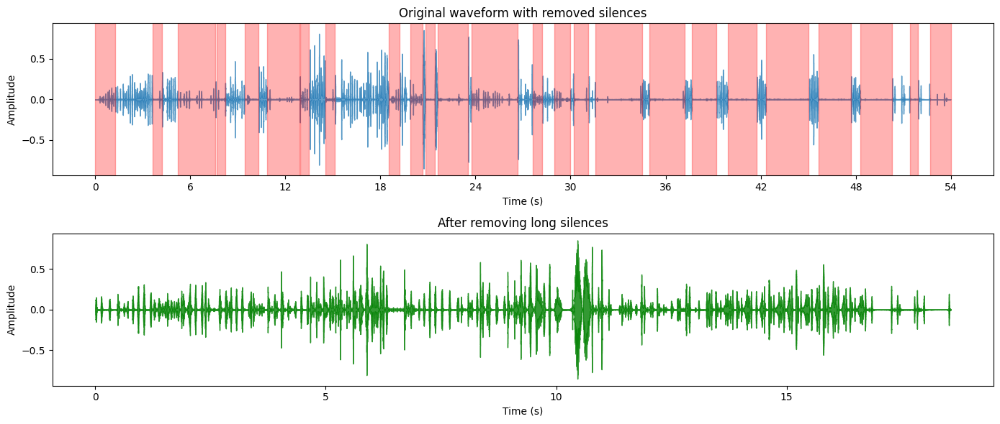

Removed silences > 0.5s
Original length: 54.00s → Trimmed length: 18.56s


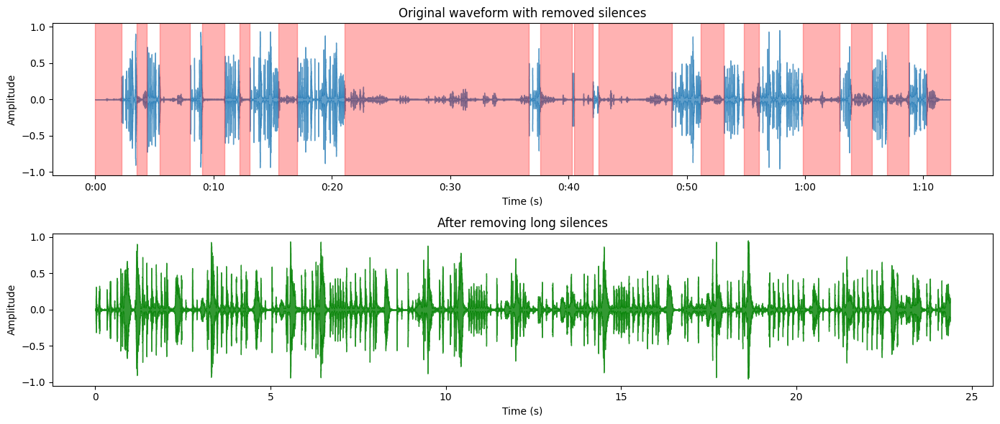

Removed silences > 0.5s
Original length: 72.26s → Trimmed length: 24.38s


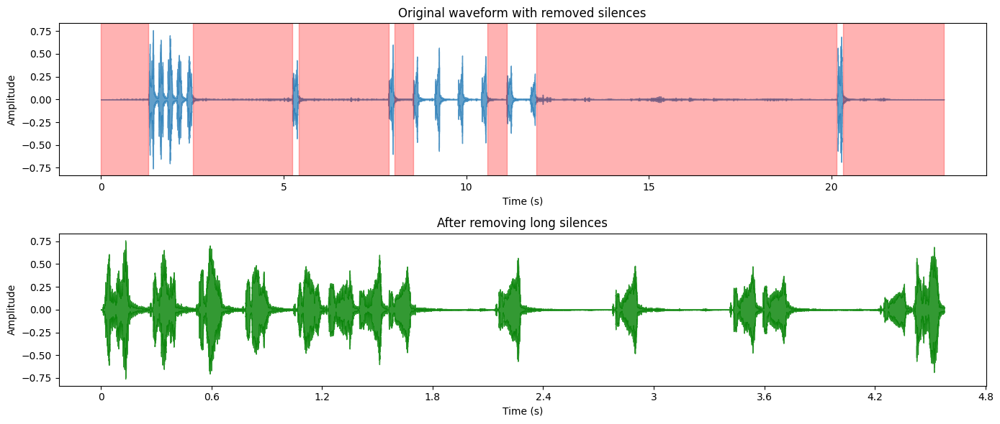

Removed silences > 0.5s
Original length: 23.08s → Trimmed length: 4.58s


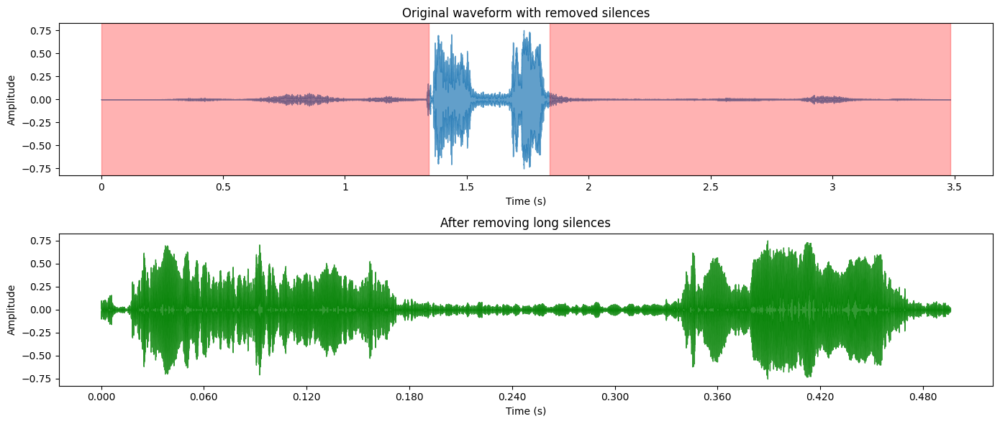

Removed silences > 0.5s
Original length: 3.48s → Trimmed length: 0.50s


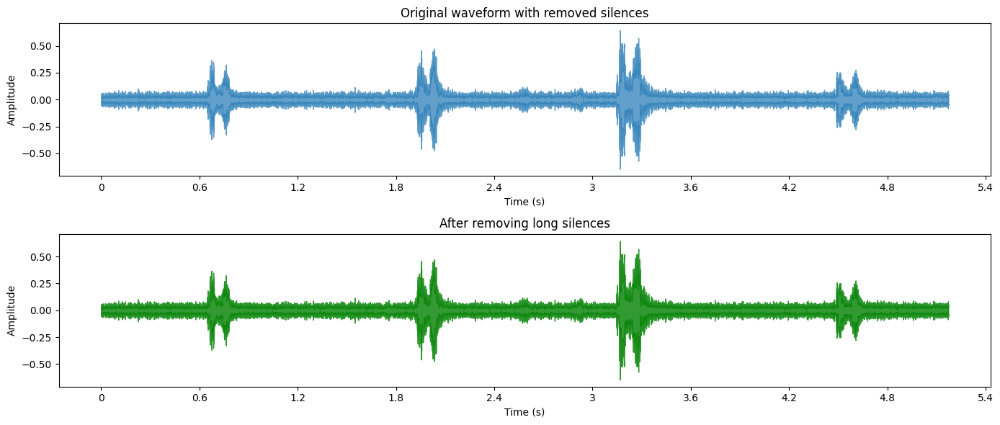

Removed silences > 0.5s
Original length: 5.17s → Trimmed length: 5.17s


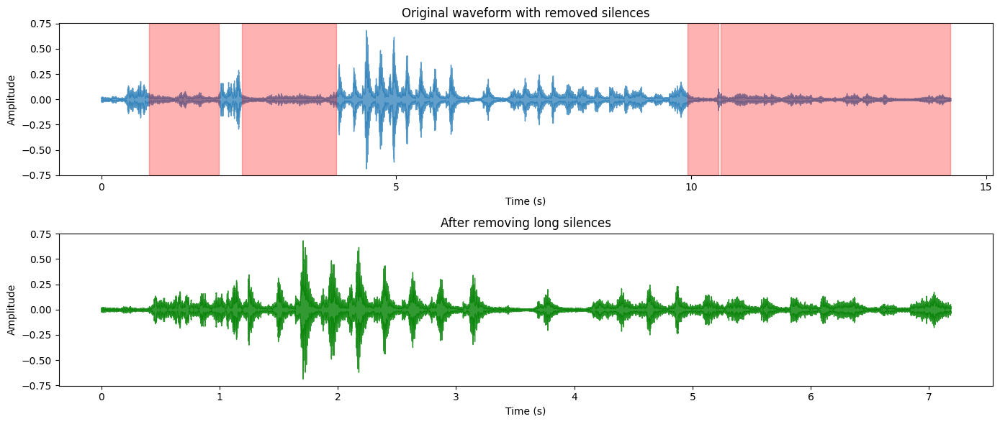

Removed silences > 0.5s
Original length: 14.40s → Trimmed length: 7.18s


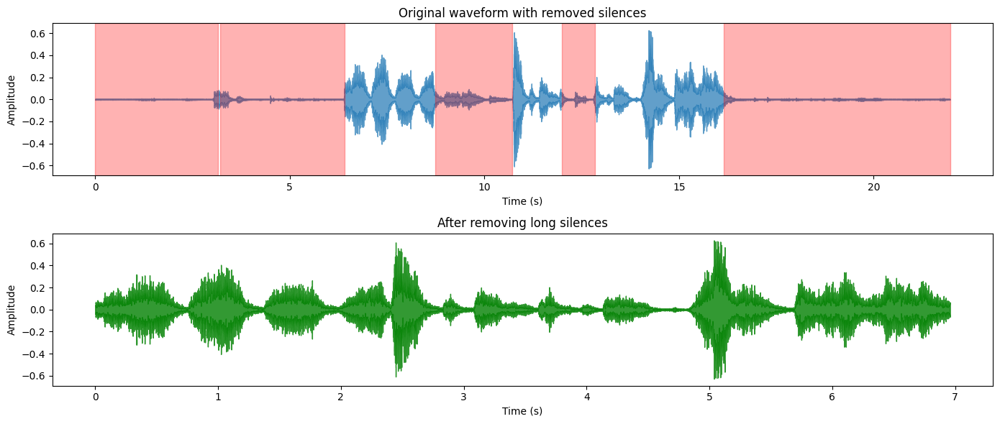

Removed silences > 0.5s
Original length: 21.96s → Trimmed length: 6.96s


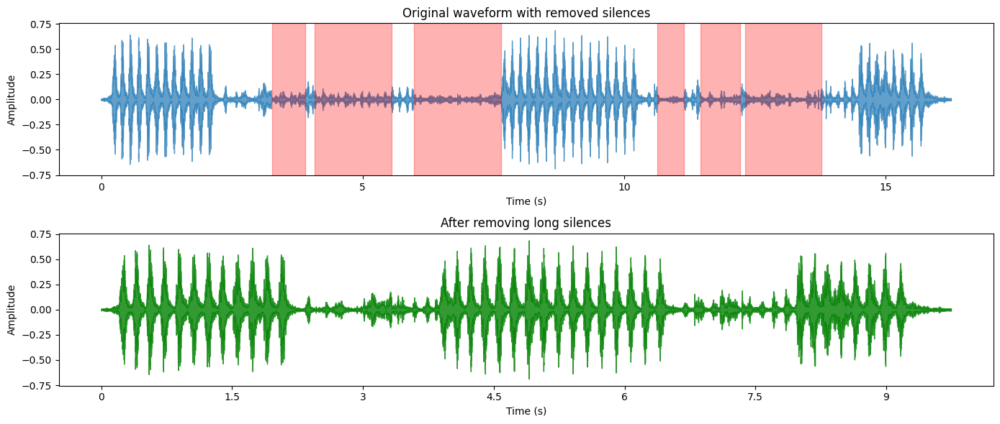

Removed silences > 0.5s
Original length: 16.26s → Trimmed length: 9.74s


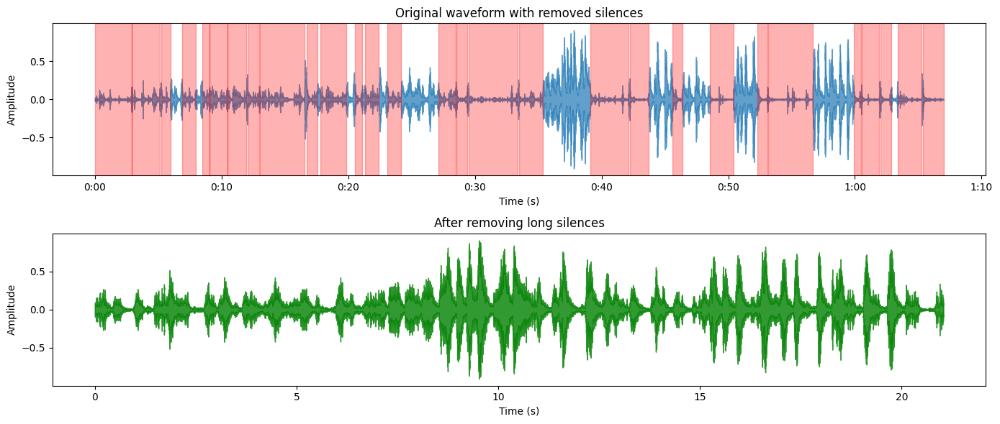

Removed silences > 0.5s
Original length: 66.99s → Trimmed length: 21.04s


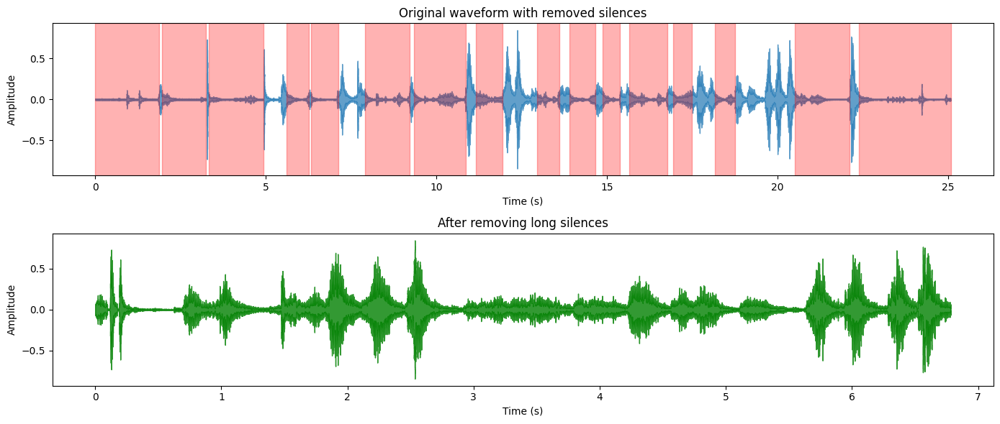

Removed silences > 0.5s
Original length: 25.08s → Trimmed length: 6.78s


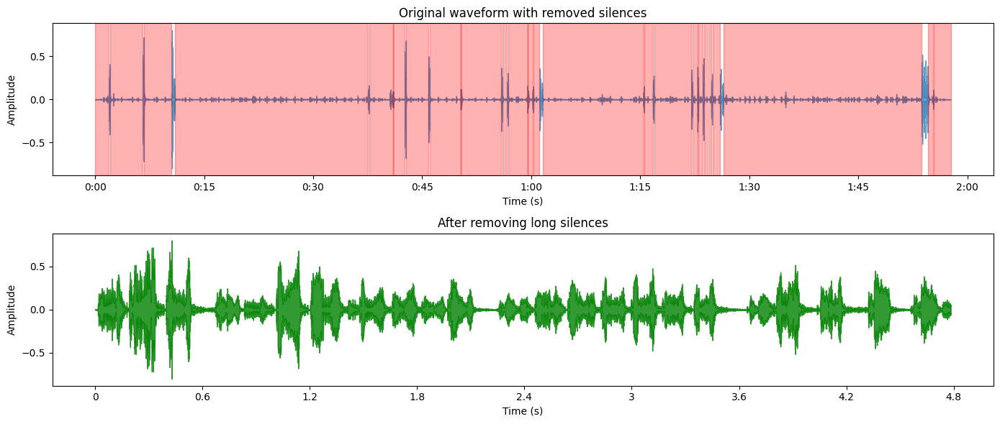

Removed silences > 0.5s
Original length: 117.73s → Trimmed length: 4.78s


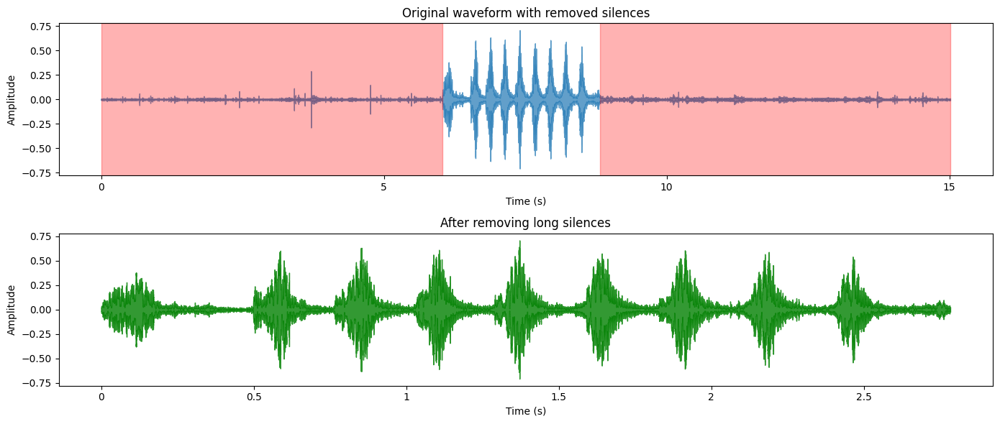

Removed silences > 0.5s
Original length: 15.02s → Trimmed length: 2.78s


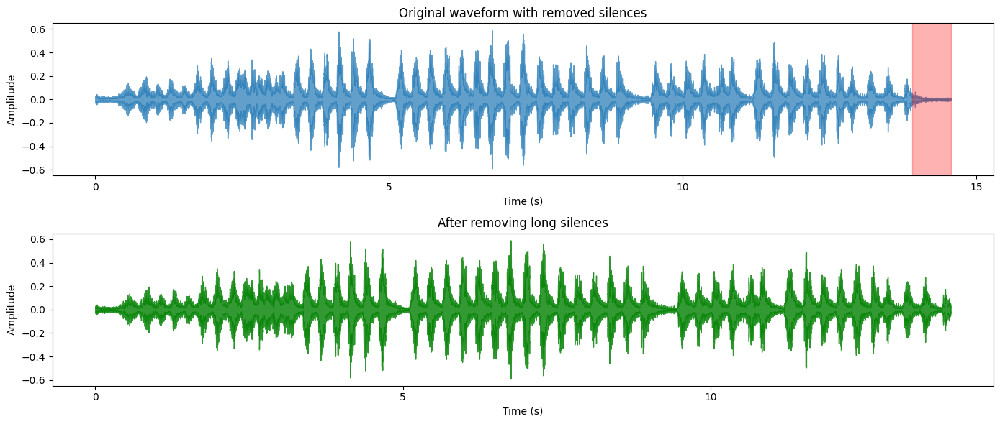

Removed silences > 0.5s
Original length: 14.56s → Trimmed length: 13.90s


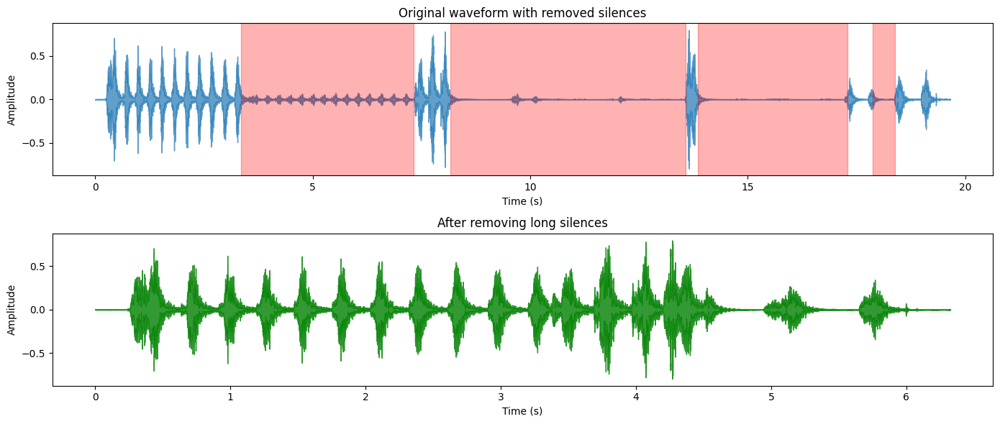

Removed silences > 0.5s
Original length: 19.65s → Trimmed length: 6.32s


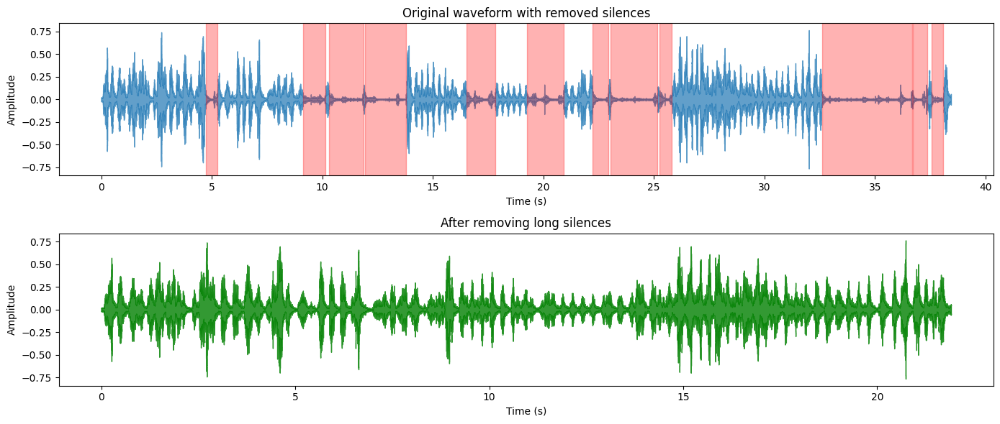

Removed silences > 0.5s
Original length: 38.45s → Trimmed length: 21.90s


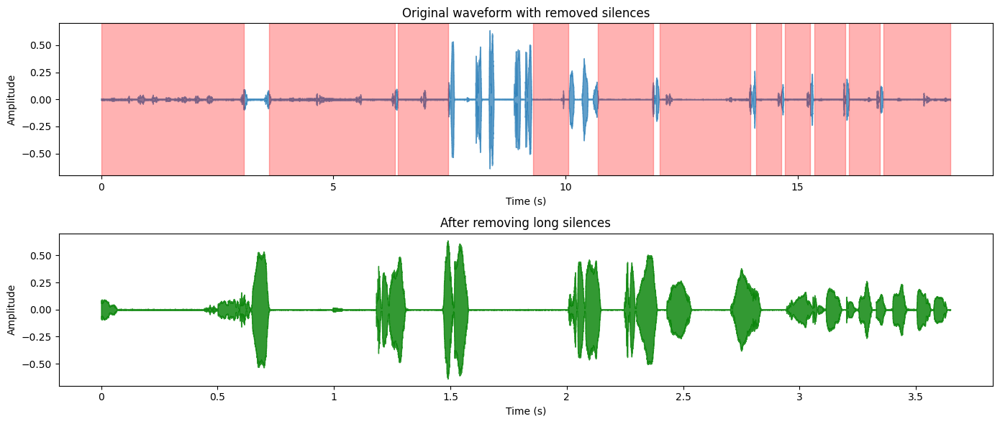

Removed silences > 0.5s
Original length: 18.29s → Trimmed length: 3.65s


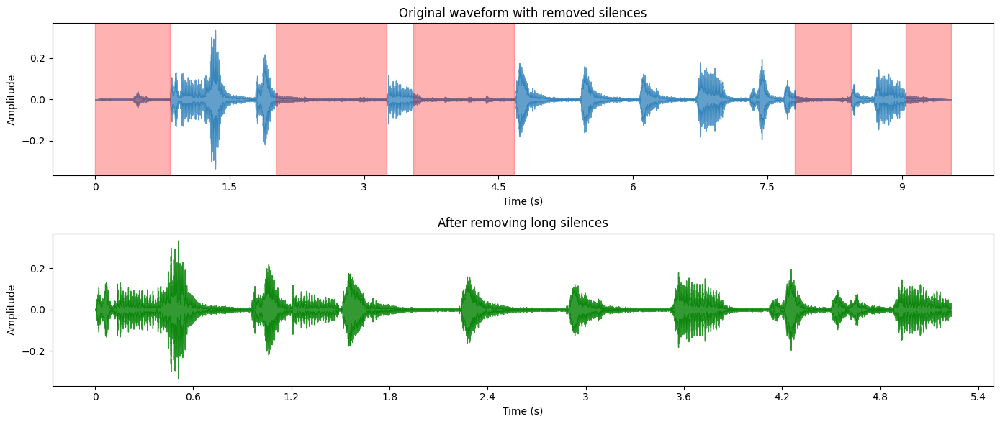

Removed silences > 0.5s
Original length: 9.55s → Trimmed length: 5.23s


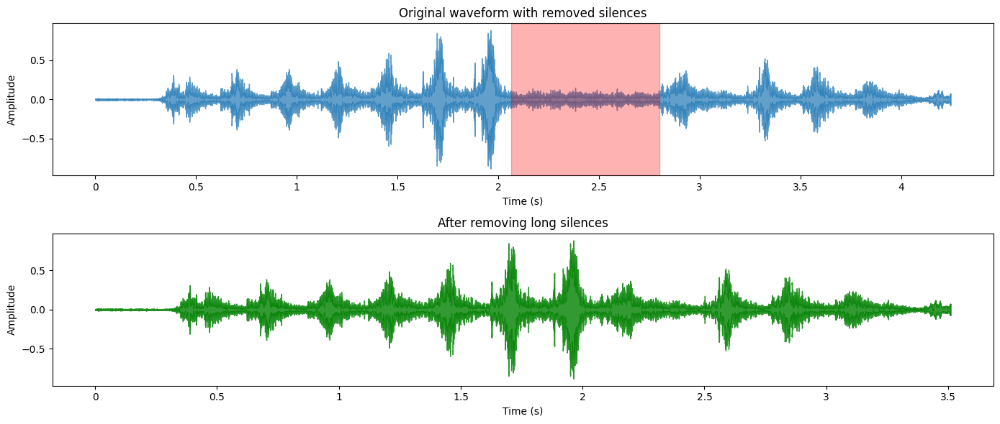

Removed silences > 0.5s
Original length: 4.25s → Trimmed length: 3.51s


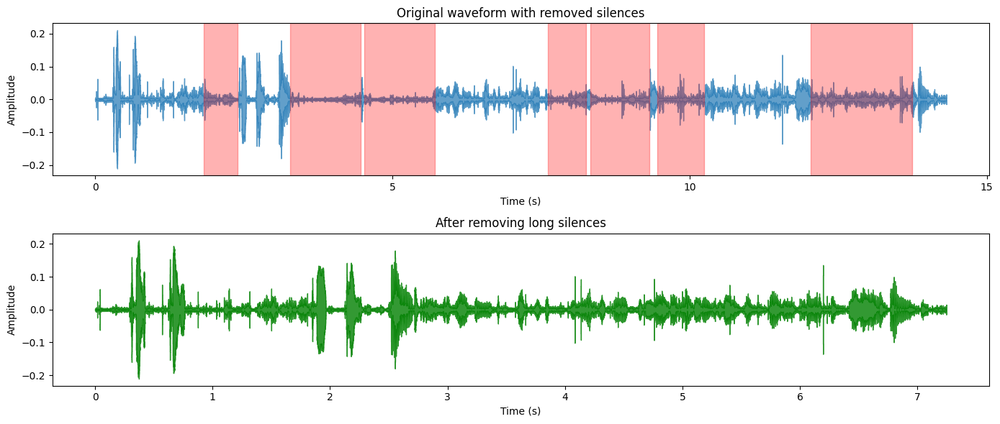

Removed silences > 0.5s
Original length: 14.32s → Trimmed length: 7.25s


In [9]:
#Remove long silences

top_db = 18
silence_threshold_sec = 0.5
sr = 32000
trimmed_signals = []

for y in denoised_signals:

    # Detect non-silent intervals
    intervals = librosa.effects.split(y, top_db=top_db)

    # Derive silent intervals
    silent_intervals = []
    prev_end = 0
    for start, end in intervals:
        if start > prev_end:
            silent_intervals.append((prev_end, start))
        prev_end = end

    if prev_end < len(y):
        silent_intervals.append((prev_end, len(y)))

    # To samples
    silence_threshold_samples = int(silence_threshold_sec * sr)

    segments = []
    removed_regions = []
    prev_end = 0

    for start, end in silent_intervals:
        silence_len = end - start
        # Append the previous sound segment
        segments.append(y[prev_end:start])

        # Keep short silences, remove long ones
        if silence_len < silence_threshold_samples:
            segments.append(y[start:end])
        else:
            removed_regions.append((start / sr, end / sr))

        prev_end = end


    y_trimmed = np.concatenate(segments) if segments else np.array([])

    trimmed_signals.append(y_trimmed)


    plt.figure(figsize=(14, 6))

    plt.subplot(2, 1, 1)
    librosa.display.waveshow(y, sr=sr, alpha=0.7)
    for s, e in removed_regions:
        plt.axvspan(s, e, color='red', alpha=0.3)
    plt.title(f"Original waveform with removed silences")
    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude")

    plt.subplot(2, 1, 2)
    if len(y_trimmed) > 0:
        librosa.display.waveshow(y_trimmed, sr=sr, alpha=0.8, color='green')
    plt.title("After removing long silences")
    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude")

    plt.tight_layout()
    plt.show()

    print(f"Removed silences > {silence_threshold_sec}s")
    print(f"Original length: {len(y)/sr:.2f}s → Trimmed length: {len(y_trimmed)/sr:.2f}s")


In [10]:
# Redimensionne la taille de toutes les signaux pour la PCA

distance=[]
n1=0

for i in range(40):
    pi=trimmed_signals[i] # prend le signal
    seuil=0.1*np.max(pi) # détermine le seuil 
    N=len(pi) # taille du signal
    while n1<N and pi[n1]<=seuil:  # moment où on dépasse le seuil
        n1+=1
    distance.append(n1)
    n1=0

# on détermine la taille minimale du signal court
min=len(trimmed_signals[0])
for i in range(40):
    if len(trimmed_signals[i])<min:
        min=len(trimmed_signals[i])

# on crée des signaux modifiés avec la même taille
court=[]
for i in range(40):
    pi=trimmed_signals[i]
    n1=distance[i]
    c=pi[n1:min+n1] # prend la taille du signal
    if len(c)<min:
        c=pi[0:min] # si plus petit on prend le minimum
    court.append(c)


In [11]:
# Fonction pour extraire la partie positive d'un signal

def positif2(x):
    p=np.zeros(len(x))
    for i in range(len(x)):
        if x[i] >= 0:
            p[i]=x[i]
    return p

In [12]:
# Fonction pour sélectionner des bandes d'énergies contenant des fréquences d'intérêt et pour déterminer la fréquence fondamentale du signal

def relative_energy_2(x, Nb, Fs, fmin, fmax):
    """
    Calcule l'énergie relative dans Nb bandes entre fmin et fmax Hz.
    
    Paramètres :
        x : signal temporel
        Nb : nombre de bandes de fréquence
        Fs : fréquence d'échantillonnage (Hz)
        fmin, fmax : bornes de la bande d'intérêt (Hz)
    Retour :
        E : énergie relative dans chaque bande (somme = 1)
    """
    Bornes=[]
    N = len(x) # longuer du signal
    X = np.fft.fft(x) # donne le spectre fréquentiel
    f = np.fft.fftfreq(N, d=1/Fs) # vecteur des fréquences associé à X
    
    # On ne garde que les fréquences positives entre fmin et fmax
    mask = (f >= fmin) & (f <= fmax)
    f_pos = f[mask]
    X_pos = X[mask]

    # Bornes des sous-bandes
    edges = np.linspace(fmin, fmax, Nb + 1) # bornes des bandes
    E = np.zeros(Nb) # energie relative de chaque bande
    
    # Énergie totale dans [fmin, fmax]
    total_energy = np.sum(np.abs(X_pos)**2) # calcul energie total
        # Fréquence fondamentale
    X_pos = X[f > 0]
    f_pos = f[f > 0]
    idx = np.argmax(np.abs(X_pos))
    f0 = f_pos[idx]
    # Énergie dans chaque sous-bande
    for i in range(Nb):
        f_low, f_high = edges[i], edges[i+1]
        band_mask = (f_pos >= f_low) & (f_pos < f_high)
        E[i] = np.sum(np.abs(X_pos[band_mask])**2) # prend la séquence entre deux bornes
        Bornes.append((f_low,f_high))
    # Normalisation (énergie relative)
    E /= total_energy 
    
    return E,Bornes,f0

# Calcul des métriques d'intérêt pour la PCA 

def compute_features(X): # renvoie le tableaux avec signaux en colonne et les features en lignes
    N,M=np.shape(X) # les signaux en colonnes(N) et les lignes avec chaque point(M)
    Y=np.zeros((7,M)) # 8 features en lignes et M colonnes
    for i in range(M): # on fait signal par signal
        Y[0,i]=np.mean(positif2(X[:,i])) # on rempli la première ligne pour signal i avec la moyenne du signal i 
        #Y[1,i]=np.var(X[:,i]) # variance
        #Y[2,i]=np.sqrt(np.sum(X[:,i])**2) # ecart type
        E,Bornes,f0=relative_energy_2(X[:,i],5,32000,3000,5000) # calcul de l'énergie 4000-5000, 3800-4600 E1-E5
        Y[1,i]=f0
        Y[2:7,i]=E # energie les trois dernière valeur
    return Y,Bornes

# Réalisation de la PCA

def my_pca(X):
    D,M=np.shape(X)
    X_=np.zeros((D,M)) 
    for d in range(D): # pour chaque feature
        X_[d,:]=(X[d,:]-np.mean(X[d,:]))/np.std(X[d,:]) # normalise selon la features
    U,S,Vt=np.linalg.svd(X_) 
    var_exp=S**2/(M-1)
    S2=np.zeros((D,M))
    S2[:D,:D]=np.diag(S)
    return U, np.dot(S2,Vt), var_exp

# Affichage PCA 

def plot_correlation_circle(U,feature_names,var_exp):
    D,D=np.shape(U)
    figure, axes = plt.subplots()
    for d in range(D):
        plt.plot([0,U[d,0]],[0,U[d,1]])
        plt.text(U[d,0]+0.01, U[d,1]+0.01,feature_names[d])
    theta = np.linspace(0, 2*np.pi, 100)
    radius = 1
    a = radius*np.cos(theta)
    b = radius*np.sin(theta)
    axes.set_aspect(1)
    v=np.round(1000*var_exp/np.sum(var_exp))/10
    plt.plot(a,b,'k')   
    plt.xlabel("PC1 : "+str(v[0])+" % of total variance")
    plt.ylabel("PC2 : "+str(v[1])+" % of total variance")
    plt.show()


[(np.float64(3000.0), np.float64(3400.0)), (np.float64(3400.0), np.float64(3800.0)), (np.float64(3800.0), np.float64(4200.0)), (np.float64(4200.0), np.float64(4600.0)), (np.float64(4600.0), np.float64(5000.0))]


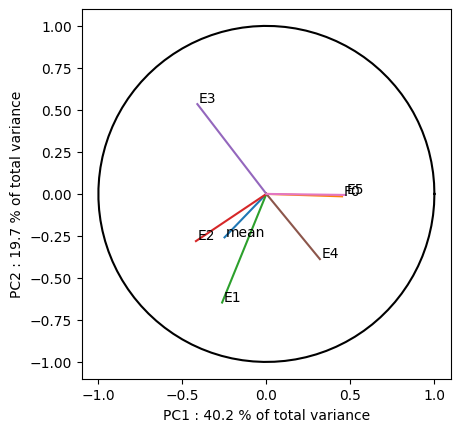

In [13]:
# Afficher ACP

Y = np.column_stack(court) # les signaux en colonnes et les lignes avec chaque point
X,Bornes=compute_features(Y) # renvoie le tableaux avec signaux en colonne et les features en lignes
print(Bornes)
D,M=np.shape(X)
U,S_,var_exp=my_pca(X) # analyse en composante principale
feature_names = [
 'mean',
 'F0',
 'E1','E2','E3','E4','E5']

plot_correlation_circle(U,feature_names,var_exp)

In [14]:
# Visualisation de l'importance de chaque métrique

score=np.sqrt(U[:,0]**2+U[:,1]**2) 
ind = np.argsort(score)
ind=ind[::-1]

for d in range(D):
    print("Feature ", feature_names[ind[d]], " : ",score[ind[d]])

Feature  E1  :  0.6979998618152629
Feature  E3  :  0.6741897398096109
Feature  E2  :  0.5045737309627054
Feature  E4  :  0.5018443472139414
Feature  E5  :  0.4688795060476723
Feature  F0  :  0.4506169683987124
Feature  mean  :  0.35905200937016907


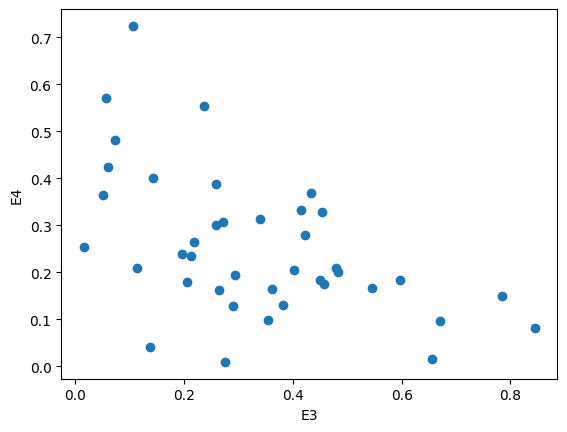

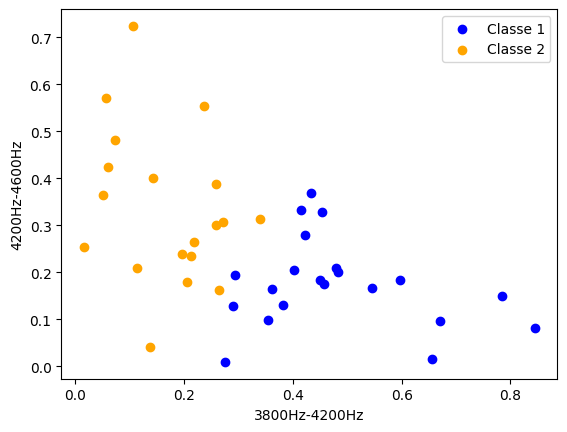

In [15]:
# Création de deux groupes selon E3 et E4

P=X[[4,5],:]
plt.scatter(X[4,:], X[5,:])
plt.xlabel('E3')
plt.ylabel('E4')
plt.show()

P_t = P.T  # maintenant shape = (nombre_signaux, nombre_features)

# Créer le modèle KMeans avec 2 clusters
kmeans = KMeans(n_clusters=2, random_state=42)

# Appliquer le clustering
kmeans.fit(P_t)

# Récupérer les labels des clusters
labels = kmeans.labels_

plt.scatter(X[4, labels==0], X[5, labels==0], color='blue', label='Classe 1')
plt.scatter(X[4, labels==1], X[5, labels==1], color='orange', label='Classe 2')

plt.xlabel('3800Hz-4200Hz')
plt.ylabel('4200Hz-4600Hz')
plt.legend()
plt.show()

In [16]:
feature_E3 = list(X[4])
feature_E4 = list(X[5])

relative_energy_feature = []

for i in range(40):
    energy_per_signal = []
    energy_per_signal.append(feature_E3[i])
    energy_per_signal.append(feature_E4[i])
    relative_energy_feature.append(energy_per_signal)
print(relative_energy_feature)


[[np.float64(0.21738859059545063), np.float64(0.26421582865055665)], [np.float64(0.35448881597332654), np.float64(0.09873487119943661)], [np.float64(0.29394136131752696), np.float64(0.1939264998395046)], [np.float64(0.05068930282337512), np.float64(0.3637298374767816)], [np.float64(0.19607932227827304), np.float64(0.2392885252109821)], [np.float64(0.5455644651093934), np.float64(0.16745200870008237)], [np.float64(0.2755271707201826), np.float64(0.009538084943348834)], [np.float64(0.26433211979742904), np.float64(0.16272808711270184)], [np.float64(0.7847361585427554), np.float64(0.14914314460144384)], [np.float64(0.656426715605109), np.float64(0.01609054535902679)], [np.float64(0.2902476698956077), np.float64(0.12927721126012923)], [np.float64(0.47881426405991834), np.float64(0.2091001441579392)], [np.float64(0.015499774442848502), np.float64(0.2529282096808725)], [np.float64(0.05971320942597854), np.float64(0.4235130019077218)], [np.float64(0.45621876702115377), np.float64(0.1755899966

In [17]:
#Extract number of short silences

mean_silence_size = []
file_silence_size = []
feature_silence = []
sr = 32000

for y in trimmed_signals:

    # Non-silent intervals
    intervals = librosa.effects.split(y, top_db=25)

    # Derive silent intervals
    silent_intervals = []
    prev_end = 0
    for start, end in intervals:
        if start > prev_end:
            silent_intervals.append((prev_end, start))
        prev_end = end

    # Silence lengths in samples
    silence_samples = []
    for interval in silent_intervals:
        silence_len = abs(interval[1] - interval[0])
        if silence_len < 6000:
            silence_samples.append(silence_len)
        

    feature_silence.append(len(silence_samples))

print(feature_silence)
 

[69, 5, 0, 81, 69, 112, 13, 6, 59, 96, 82, 55, 15, 48, 103, 64, 88, 80, 146, 53, 54, 77, 90, 4, 0, 0, 4, 9, 14, 15, 3, 6, 1, 4, 10, 28, 4, 3, 1, 16]


In [18]:
# Extract most significant motif for each signal

max_duration = 20        # seconds
threshold_gpu = 200_000  # switch between CPU/GPU
L = .15                # motif window length (seconds)
Fs = 32000
nbr=0
best_motifs = []

for signal in court:
    nbr+=1
    print(f"Processing: signal {nbr}")

    audio_data = signal
    threshold_gpu = 200_000

    if len(audio_data) > max_duration * Fs:
        audio_data = audio_data[:int(max_duration * Fs)]

    x = audio_data.astype(np.float64)

    w = int(L * Fs)
    print(f"Window size: {w} samples")
    print(f"Signal length: {len(x)} samples")

    start = time.time()
    if len(x) < threshold_gpu:
        mp = stumpy.stump(x, m=w)
        method = "CPU"
    else:
        mp = stumpy.gpu_stump(x, m=w)
        method = "GPU"
    elapsed = time.time() - start

    matrix_profile = mp[:, 0]
    best_index = np.argmin(matrix_profile)
    best_motif = x[best_index:best_index + w]
    print(f"Best motif starts at index {best_index}")

    best_motifs.append(best_motif)

print("All signals processed, best motif per signal saved.")


Processing: signal 1
Window size: 4800 samples
Signal length: 15872 samples
Best motif starts at index 634
Processing: signal 2
Window size: 4800 samples
Signal length: 15872 samples
Best motif starts at index 649
Processing: signal 3
Window size: 4800 samples
Signal length: 15872 samples
Best motif starts at index 1969
Processing: signal 4
Window size: 4800 samples
Signal length: 15872 samples
Best motif starts at index 4286
Processing: signal 5
Window size: 4800 samples
Signal length: 15872 samples
Best motif starts at index 206
Processing: signal 6
Window size: 4800 samples
Signal length: 15872 samples
Best motif starts at index 5167
Processing: signal 7
Window size: 4800 samples
Signal length: 15872 samples
Best motif starts at index 7051
Processing: signal 8
Window size: 4800 samples
Signal length: 15872 samples
Best motif starts at index 157
Processing: signal 9
Window size: 4800 samples
Signal length: 15872 samples
Best motif starts at index 3327
Processing: signal 10
Window siz

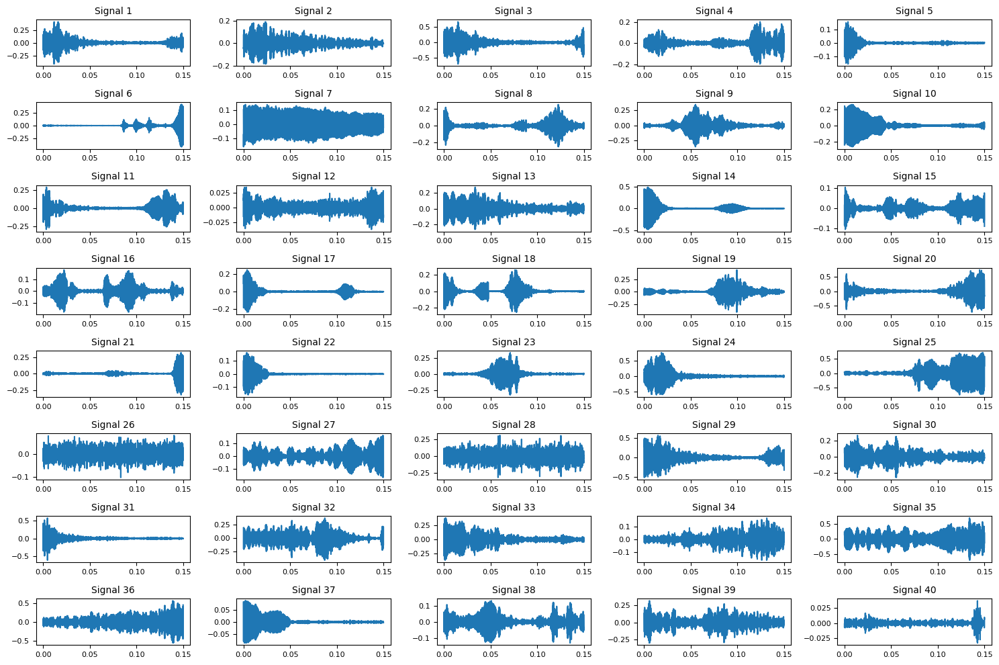

In [19]:
# Show motifs
samp_r = 32000
sig = best_motifs

num_signals = len(sig)
rows = 8
cols = 5

fig, axes = plt.subplots(rows, cols, figsize=(15, 10))
axes = axes.flatten()

for i, signal in enumerate(sig):
    # Ensure we don’t go beyond the available axes
    if i >= len(axes):
        break

    t = np.arange(len(signal)) / samp_r  # time axis in seconds
    axes[i].plot(t, signal)
    axes[i].set_title(f"Signal {i+1}", fontsize=10)
    axes[i].tick_params(labelsize=8)

# Hide unused subplots
for j in range(i+1, rows*cols):
    axes[j].axis('off')

plt.tight_layout()
plt.show()


          Motif 1 Motif 2 Motif 3 Motif 4 Motif 5 Motif 6 Motif 7 Motif 8  \
Signal 1   Class1  Class2  Class2  Class1  Class2  Class2  Class2  Class2   
Signal 2   Class2  Class1  Class1  Class2  Class2  Class1  Class1  Class1   
Signal 3   Class2  Class1  Class1  Class2  Class2  Class2  Class2  Class2   
Signal 4   Class1  Class2  Class2  Class1  Class2  Class2  Class2  Class2   
Signal 5   Class1  Class2  Class2  Class1  Class1  Class1  Class2  Class1   
Signal 6   Class2  Class1  Class1  Class1  Class1  Class1  Class1  Class1   
Signal 7   Class1  Class2  Class2  Class2  Class2  Class2  Class1  Class2   
Signal 8   Class1  Class2  Class1  Class2  Class1  Class1  Class1  Class1   
Signal 9   Class2  Class1  Class2  Class1  Class2  Class1  Class1  Class2   
Signal 10  Class2  Class1  Class2  Class2  Class2  Class1  Class1  Class1   
Signal 11  Class2  Class2  Class2  Class1  Class1  Class1  Class2  Class2   
Signal 12  Class2  Class1  Class1  Class2  Class1  Class1  Class2  Class1   

/tmp/ipykernel_8948/4290068908.py:40: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  heatmap_data = classification_df.replace({"Class1": 1, "Class2": 0})


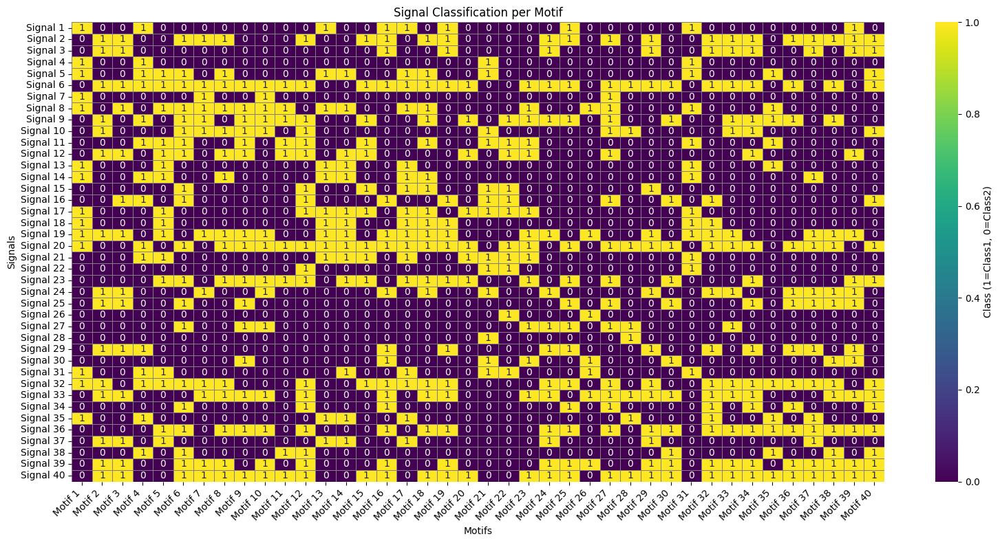

In [20]:
# Classify based on motif correlation

threshold_method = "mean"  # "median", "mean", or manual number

def normalize(x):
    x = x.astype(np.float32)
    return (x - np.mean(x)) / np.std(x)

signals = []
signal_index = []
for idx, data in enumerate(court):
    signals.append(normalize(data))
    signal_index.append(f'Signal {idx+1}')

motif_labels = [f'Motif {i+1}' for i in range(len(best_motifs))]
classification_df = pd.DataFrame(index=signal_index, columns=motif_labels)

for j, motif in enumerate(best_motifs):
    motif = normalize(motif)

    similarities = []
    for s in signals:
        corr = correlate(s, motif, mode='valid')
        max_corr = np.max(np.abs(corr))
        similarities.append(max_corr)
    
    if threshold_method == "median":
        threshold = np.median(similarities)
    elif threshold_method == "mean":
        threshold = np.mean(similarities)
    else:
        threshold = float(threshold_method)
    
    labels = ["Class1" if sim >= threshold else "Class2" for sim in similarities]
    
    classification_df[motif_labels[j]] = labels

print(classification_df)

heatmap_data = classification_df.replace({"Class1": 1, "Class2": 0})

plt.figure(figsize=(16, 8))
sns.heatmap(
    heatmap_data,
    cmap="viridis",
    cbar_kws={'label': 'Class (1=Class1, 0=Class2)'},
    linewidths=0.5,
    linecolor='gray',
    annot=True,
    fmt="d"
)
plt.title("Signal Classification per Motif")
plt.xlabel("Motifs")
plt.ylabel("Signals")
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


In [21]:
#Concatenate all features

feature_1 = feature_silence
feature_2 = relative_energy_feature
feature_3 = best_motifs

combined_features = []

for f1, f2, f3 in zip(feature_1, feature_2, feature_3):

    arr1 = np.array([f1])
    arr2 = np.array(f2)
    arr3 = np.array(f3)
    
    combined = np.concatenate([arr1, arr2, arr3])
    combined_features.append(combined)

X = np.array(combined_features)

print("Feature matrix shape:", X.shape)

Feature matrix shape: (40, 4803)


In [22]:
# Save combined_features to npz file

np.savez_compressed("combined_features.npz", X=X)

print("Combined features saved to 'combined_features.npz'")


Combined features saved to 'combined_features.npz'


In [23]:
#Kmeans for final classification based on combined_features.npz

data = np.load("combined_features.npz")
X_loaded = data["X"]

n_clusters = 2  # choose the number of clusters
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
kmeans.fit(X_loaded)

labels = kmeans.labels_
print("Cluster labels for each signal:", labels)


Cluster labels for each signal: [0 1 1 0 0 0 1 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1]
